In [1]:
import networkx as nx
import pandas as pd
import numpy as np
import geopandas as gpd
import momepy as mm
from shapely.geometry import LineString, Point
from shapely.ops import linemerge, split
from copy import deepcopy

import osmnx as ox

from datetime import datetime
import matplotlib.pyplot as plt

/Users/gsagostini/opt/anaconda3/envs/momepy_env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


For now, ignore shapely deprecation warnings:

In [2]:
import warnings
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning)

# Consolidating Intersections

In [3]:
dist_threshold=30 #parameter to consolidate intersections. This has different meanings depending on whether we use OSMnx or the network way, will be clarified

## 1. Collecting Data

In [4]:
point = 40.789134, -73.972175 #NYC
dist = 3500

In [5]:
graph = ox.graph_from_point(point, dist=dist,
                            network_type='drive', simplify=True)
graph_proj = ox.project_graph(graph)
graph_proj_und = ox.get_undirected(graph_proj)

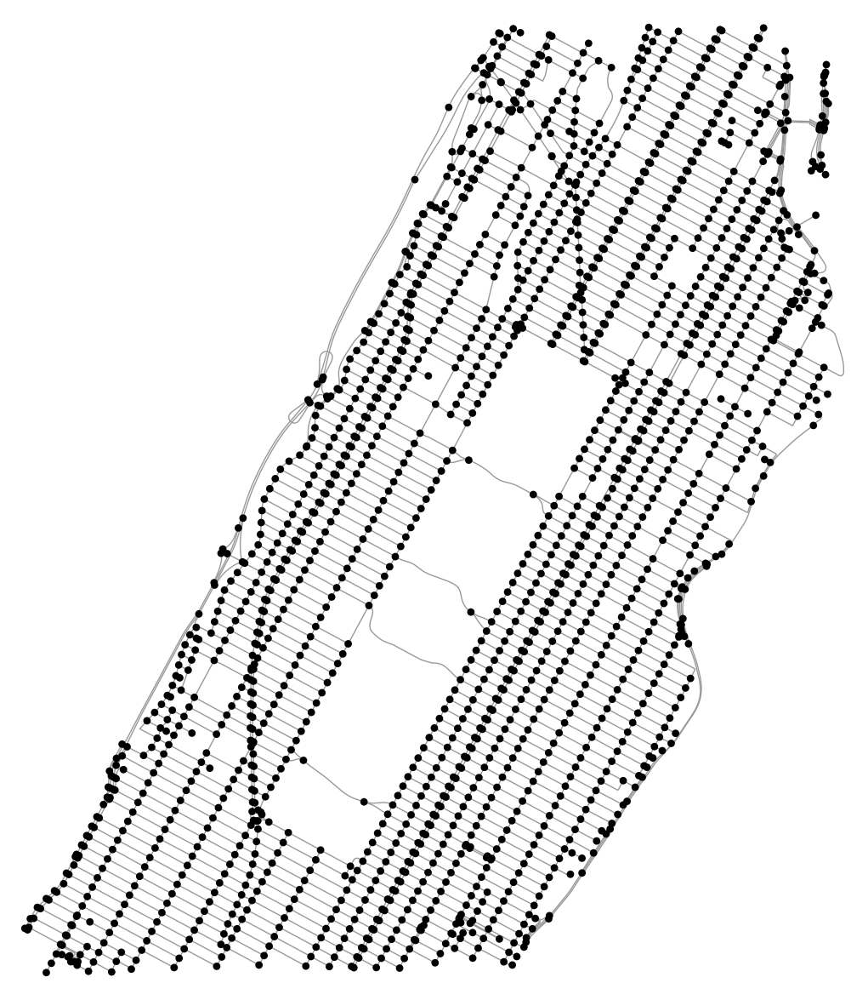

In [6]:
fig, ax = ox.plot_graph(graph_proj_und, figsize=(15,15), node_color='k', node_size=40, bgcolor='white')
plt.show()

Defining parameters as we will name them in the docs:

In [7]:
graph = graph_proj_und
tolerance=dist_threshold
rebuild_graph=True
rebuild_edges_method="spider"
directed=None
x_col="x"
y_col="y"
edge_from_col="from"
edge_to_col="to"

if directed is None:
    directed = True if isinstance(graph, nx.MultiDiGraph) else False

## 2. Baseline OSMNx function

I will compare my results to the consolidate intersection functions from the simplify module in osmnx:

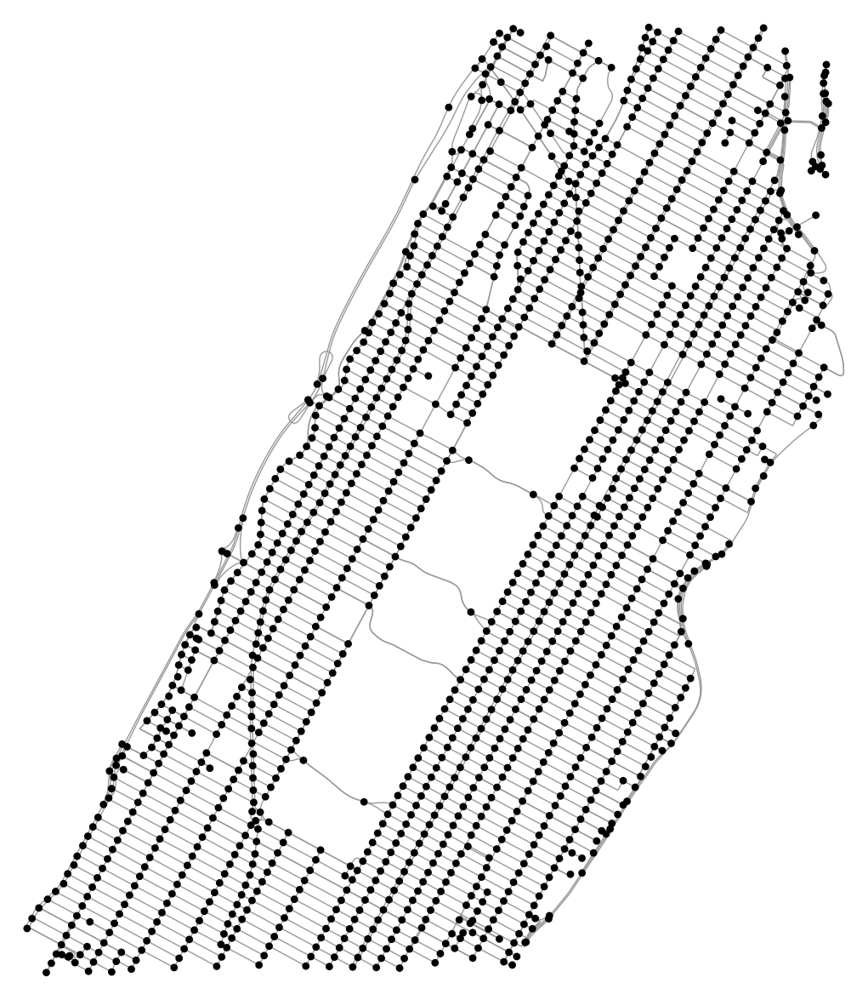

In [8]:
graph_cons = ox.simplification._consolidate_intersections_rebuild_graph(graph_proj, tolerance=dist_threshold*(2/3))
fig, ax = ox.plot_graph(graph_cons, figsize=(15,15), node_color='k', node_size=40, bgcolor='white')
plt.show()

The function does not work for undirected graphs

## 3. Assessing Network components directly

We will use the graph nodes throughout. It will be easier to have them as a dataframe.

In [9]:
nodes, nodes_dict = zip(*graph.nodes(data=True))
nodes_df = pd.DataFrame(nodes_dict, index=nodes)
nodes_geometries = gpd.points_from_xy(nodes_df[x_col], nodes_df[y_col])
graph_crs = graph.graph.get("crs")
nodes_gdf = gpd.GeoDataFrame(
    nodes_df,
    crs=graph_crs,
    geometry=nodes_geometries,
)

Rather than buffering nodes to check proximity and then checking whether the nodes are connected, we can check if the nodes are connected in the graph directly. A way of doing so is to first remove all edges longer than our connectivity threshold, and then discard the isolated nodes. The remaining graph components are precisely the independent node clusters:

In [10]:
components_graph = deepcopy(graph)
if not directed:
    components_graph = nx.MultiGraph(components_graph)
components_graph.remove_edges_from(
    [
        edge
        for edge in graph.edges(keys=True, data=True)
        if edge[-1]["length"] > tolerance
    ]
)
isolated_nodes_list = list(nx.isolates(components_graph))
components_graph.remove_nodes_from(isolated_nodes_list)

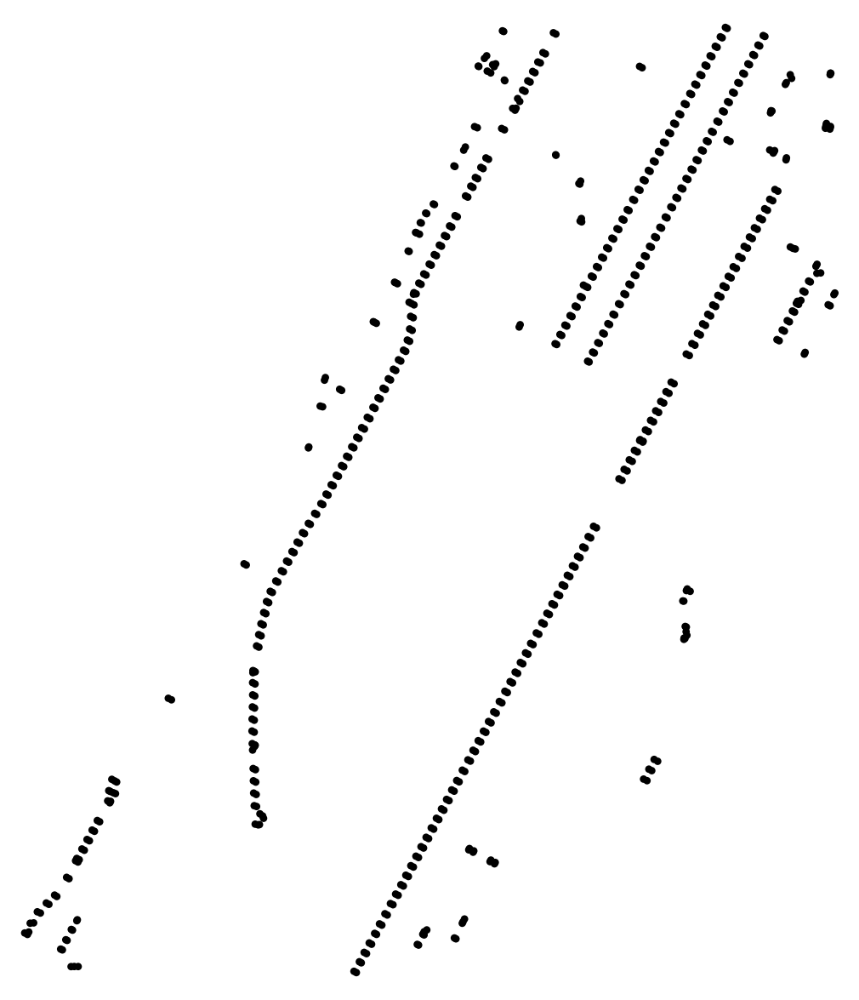

In [11]:
fig, ax = ox.plot_graph(components_graph, figsize=(15,15), node_color='k', node_size=40, bgcolor='white')
plt.show()

The connected components of this graph are node clusters we must individually simplify. We collect them in a dataframe and retrieve node properties (x, y coords mainly) from the original graph. Note that such function is very useful because it independently identifies which groups of nodes need some sort of simplification. In a later improvement---for folks who want a better simplification function---we could classify such groups and do tailored simplification e.g. for roundabouts, for bridges.

In [12]:
components = nx.connected_components(components_graph)
components_dict = dict(enumerate(components, start=max(nodes) + 1))
nodes_to_merge_dict = {
    node: cpt for cpt, nodes in components_dict.items() for node in nodes
}
new_nodes_df = pd.DataFrame.from_dict(
    nodes_to_merge_dict, orient="index", columns=["cluster"]
)
nodes_to_merge_df = pd.concat(
    [new_nodes_df, nodes_df[[x_col, y_col]]], axis=1, join="inner"
)

Each cluster can be represented as the centroid of its members. We average the x and y attributes in every cluster:

In [13]:
cluster_centroids_df = nodes_to_merge_df.groupby("cluster").mean()
cluster_centroids_df["simplified"] = True
cluster_centroids_df["original_node_ids"] = cluster_centroids_df.index.map(
    components_dict
)
cluster_geometries = gpd.points_from_xy(
    cluster_centroids_df[x_col], cluster_centroids_df[y_col]
)
cluster_gdf = gpd.GeoDataFrame(
    cluster_centroids_df, crs=graph_crs, geometry=cluster_geometries
)
cluster_nodes_list = list(cluster_gdf.to_dict("index").items())

### 3.a. Rebuilding edges

Now we must rebuild the edges. This is by far the trickiest part. There many ways this can be done:

1. We do not do it. In OSMNx, user can select "rebuild_graph=False". Then the graph is retrieved with nodes only. This is useful for folks studying node properties, but has little application to morphology. (in such case, we also didn't need the edge gdf)
2. Connect nodes to the clusters via an "unapologethic straight line" i.e. as the crow flies. This ignores any pre-existing geometry indication. This is the fastest "reconnection method" and, most importantly, it preserves adjacency. For folks studying network properties (degree distribution, random walks, motif analysis) that do not rely in the edge geometry, this is ideal.
3. Connect nodes to the clusters via an estimation of what the simplified edge would look like. This is more laborous and subjective. Two ways of doing so are (i) to extend the line from the original collapsed node to the centroid and (ii) to crop the line a little bit before the original collapsed node and then extend it to the centroid. The first is a "linear" reconstruction, where the latter is more of a "spider web" reconstruction. 

To begin, we need the edge GeoDataFrame:

In [14]:
graph.graph["approach"] = "primal"
edges_gdf = mm.nx_to_gdf(graph, points=False, lines=True)

Using our mapping of nodes to clusters, we create a column with OD clusters:

In [15]:
edges_gdf["origin_cluster"] = edges_gdf[edge_from_col].apply(lambda u: nodes_to_merge_dict[u] if u in nodes_to_merge_dict else -1)
edges_gdf["destination_cluster"] = edges_gdf[edge_to_col].apply(lambda v: nodes_to_merge_dict[v] if v in nodes_to_merge_dict else -1)

We select what edges need to be simplified. Those are of three kinds:

1. Edges between two different cluster centroids
2. Edges between an unchanged node and a cluster centroid
3. Self-loops on a cluster centroid

In [16]:
query_string = f"origin_cluster != destination_cluster or (('{edge_to_col}' == '{edge_from_col}') and origin_cluster >= 0)"
edges_tosimplify_gdf = edges_gdf.query(query_string)

Find new points geometry:

In [17]:
edges_tosimplify_gdf = edges_tosimplify_gdf.assign(new_origin_pt=edges_tosimplify_gdf.origin_cluster.map(cluster_gdf.geometry, None))
edges_tosimplify_gdf = edges_tosimplify_gdf.assign(new_destination_pt=edges_tosimplify_gdf.destination_cluster.map(cluster_gdf.geometry, None))

For now, let's focus on the edge estimation with spider-web simplification:

In [18]:
def _spider_simplification(geometry, new_origin, new_destination, buff=15):
    """
    Extends edge geometry to new endpoints via a "spider-web" method. Breaks
      current geometry within a buffer of the new endpoint and then extends
      it linearly. Useful to maintain planarity.

    If either new_origin or new_destination is None, maintains the
      respective current endpoint.

    Parameters
    ----------
    geometry : shapely.LineString
    new_origin, new_destination: shapely.Point or None
    buff : float
        distance from new endpoint to break current geometry

    Returns
    ----------
    shapely.LineString

    """
    # If we are dealing with a self-loop the line has no boundary
    # . and we just use the first coordinate:
    if new_origin == new_destination:
        current_node = Point(line_coords[0])
        geometry = linemerge([LineString([new_origin, current_node]), geometry])
    # Assuming the line is not closed, we can find its endpoints
    #  via the boundary attribute:
    else:
        current_origin, current_destination = geometry.boundary
        if new_origin is not None:
            # Create a buffer around the new origin:
            new_origin_buffer = new_origin.buffer(buff)
            # Use shapely.ops.split to break the edge where it
            #  intersects the buffer:
            geometry_split_by_buffer_list = list(split(geometry, new_origin_buffer))
            # If only one geometry results, edge does not intersect
            #  buffer and line should connect new origin to old origin
            if len(geometry_split_by_buffer_list) == 1:
                geometry_split_by_buffer = geometry_split_by_buffer_list[0]
                splitting_point = current_origin
            # If more than one geometry, merge all linestrings
            #  but the first and get their origin
            else:
                geometry_split_by_buffer = linemerge(geometry_split_by_buffer_list[1:])
                splitting_point = geometry_split_by_buffer.boundary[0]
            # Merge this into new geometry:
            additional_line = [LineString([new_origin, splitting_point])]
            #Consider MultiLineStrings separately:
            if geometry_split_by_buffer.geom_type == 'MultiLineString':
                geometry = linemerge(additional_line + [line for line in geometry_split_by_buffer.geoms])
            else:
                geometry = linemerge(additional_line + [geometry_split_by_buffer])
                
        if new_destination is not None:
            # Create a buffer around the new destination:
            new_destination_buffer = new_destination.buffer(buff)
            # Use shapely.ops.split to break the edge where it
            #  intersects the buffer:
            geometry_split_by_buffer_list = list(
                split(geometry, new_destination_buffer)
            )
            # If only one geometry results, edge does not intersect
            # . buffer and line should connect new destination to old destination
            if len(geometry_split_by_buffer_list) == 1:
                geometry_split_by_buffer = geometry_split_by_buffer_list[0]
                splitting_point = current_destination
            # If more than one geometry, merge all linestrings
            #  but the last and get their destination
            else:
                geometry_split_by_buffer = linemerge(geometry_split_by_buffer_list[:-1])
                splitting_point = geometry_split_by_buffer.boundary[1]
            # Merge this into new geometry:
            additional_line = [LineString([splitting_point, new_destination])]
            #Consider MultiLineStrings separately:
            if geometry_split_by_buffer.geom_type == 'MultiLineString':
                geometry = linemerge([line for line in geometry_split_by_buffer.geoms] + additional_line)
            else:
                geometry = linemerge([geometry_split_by_buffer] + additional_line)
                
    return geometry

buffer = 45
edges_simplified_geometries = edges_tosimplify_gdf.apply(
    lambda edge: _spider_simplification(
        edge.geometry, edge.new_origin_pt, edge.new_destination_pt, buffer
    ),
    axis=1,
)
edges_simplified_gdf = edges_tosimplify_gdf.assign(
    new_geometry=edges_simplified_geometries
)

We can now polish the edge geodataframe by updating the columns that require update:

In [19]:
cols_rename = {
    edge_from_col: "original_from",
    edge_to_col: "original_to",
    "origin_cluster": edge_from_col,
    "destination_cluster": edge_to_col,
    "geometry": "original_geometry",
    "new_geometry": "geometry",
}
cols_drop = ["new_origin_pt", "new_destination_pt"]
new_edges_gdf = edges_simplified_gdf.rename(cols_rename, axis=1).drop(
    columns=cols_drop
)
new_edges_gdf.loc[:, "length"] = new_edges_gdf.length

new_edges_gdf.loc[:, edge_from_col] = new_edges_gdf[edge_from_col].where(
    new_edges_gdf[edge_from_col] >= 0, new_edges_gdf["original_from"]
)
new_edges_gdf.loc[:, edge_to_col] = new_edges_gdf[edge_to_col].where(
    new_edges_gdf[edge_to_col] >= 0, new_edges_gdf["original_to"]
)

Networkx requires new edges to be passed as a list with (u,v data_dict):

In [20]:
new_edges_list = list(
    zip(
        new_edges_gdf[edge_from_col],
        new_edges_gdf[edge_to_col],
        new_edges_gdf.iloc[:, 2:].to_dict("index").values(),
    )
)

We update the graph:

In [21]:
simplified_graph = graph.copy()
if not directed:
    simplified_graph = nx.MultiGraph(simplified_graph)
simplified_graph.remove_nodes_from(nodes_to_merge_df.index)
simplified_graph.add_nodes_from(cluster_nodes_list)
new_graph = simplified_graph.add_edges_from(new_edges_list)

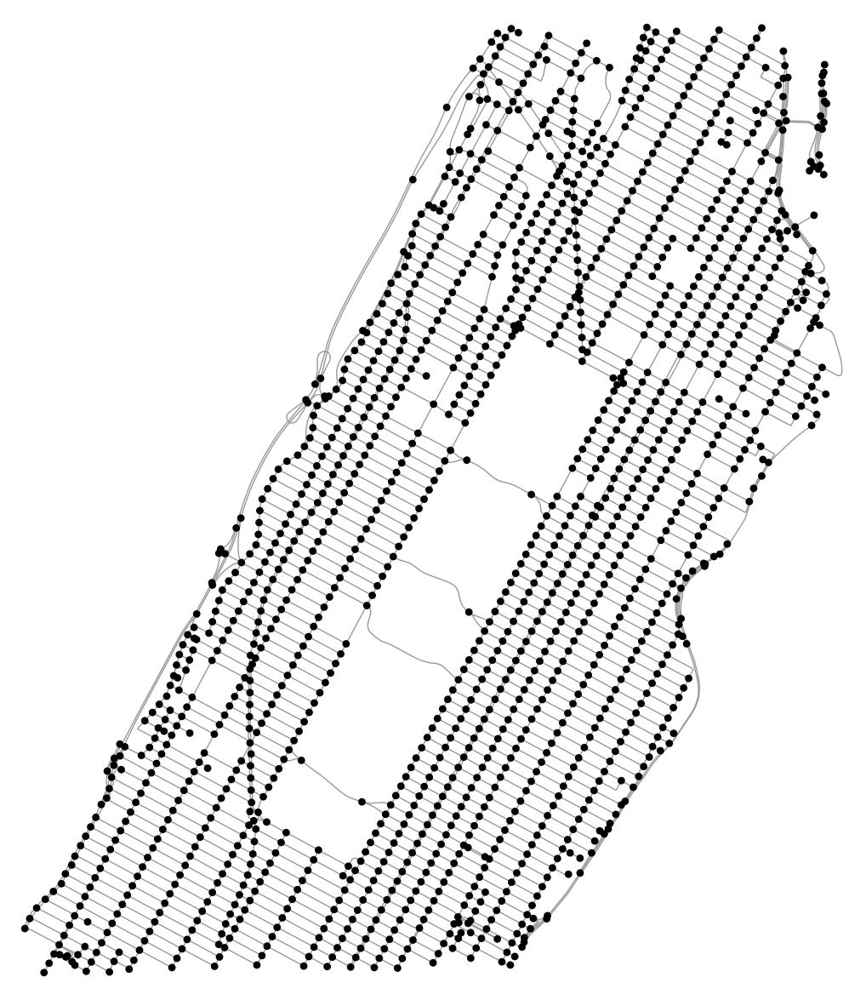

In [22]:
fig, ax = ox.plot_graph(simplified_graph, figsize=(15,15), node_color='k', node_size=40, bgcolor='white')
plt.show()

Note how the roundabout was simplified well, and there was no planarity assumption so the bridge was not merged to the node below it. However, edges do not reflect the simplification that well: the vertical two lane street in the middle-right of the plot has only one intersection but seemingly two edges. We can think of better means of simplification (averaging the lines, spider web) for those specific cases.

### 3b. Putting it together:

We can put it all in a function:

In [23]:
def consolidate_intersections(
    graph,
    tolerance=30,
    rebuild_graph=True,
    rebuild_edges_method="spider",
    directed=None,
    x_col="x",
    y_col="y",
    edge_from_col="from",
    edge_to_col="to",
):
    """
    Consolidate close street intersections into a single node, collapsing short edges.

    If rebuild_graph is True, new edges are drawn according to rebuild_edges_method which is one of:

    1. Extension reconstruction:
        Edges are linearly extended from original endpoints until the new nodes. This method preserves
        most faithfully the network geometry.
    2. Spider-web reconstruction:
        Edges are cropped within a buffer of the new endpoints and linearly extended from there. This
        method improves upon linear reconstruction by mantaining, when possible, network planarity.
    3. Euclidean reconstruction:
        Edges are ignored and new edges are built as straightlines between new origin and new
        destination. This method ignores geometry, but efficiently preserves adjacency.

    If rebuild_graph is False, graph is returned with consolidated nodes but without reconstructed
    edges i.e. graph is intentionally disconnected.

    Graph must be configured so that

    1. All nodes have attributes determining their x and y coordinates;
    2. All edges have attributes determining their origin, destination, and geometry.

    Parameters
    ----------
    graph : Networkx.MultiGraph or Networkx.MultiDiGraph
    tolerance : float
        distance in network units below which nodes will be consolidated
    rebuild_graph: Boolean
    rebuild_edges_method: string
        'extension' or 'spider' or 'euclidean'
    directed: Boolean or None
        consider the graph a MultiDiGraph if True or MultiGraph if False, and
        if None infer from the passed object type
    x_col, y_col: string
        node attribute with the valid coordinate
    edge_from_col, edge_to_col: string
        edge attribute with the valid origin/destination node id

    Returns
    ----------
    Networkx.MultiGraph or Networkx.MultiDiGraph

    """

    # Collect nodes and their data:
    nodes, nodes_dict = zip(*graph.nodes(data=True))
    nodes_df = pd.DataFrame(nodes_dict, index=nodes)
    nodes_geometries = gpd.points_from_xy(nodes_df[x_col], nodes_df[y_col])
    graph_crs = graph.graph.get("crs")
    nodes_gdf = gpd.GeoDataFrame(
        nodes_df,
        crs=graph_crs,
        geometry=nodes_geometries,
    )

    # In case we did not specify directionality, we infer it from the network:
    if directed is None:
        directed = True if isinstance(graph, nx.MultiDiGraph) else False

    # Create a graph without the edges above a certain length and clean it
    #  from isolated nodes (the unsimplifiable nodes):
    components_graph = deepcopy(graph)
    if not directed:
        components_graph = nx.MultiGraph(components_graph)
    components_graph.remove_edges_from(
        [
            edge
            for edge in graph.edges(keys=True, data=True)
            if edge[-1]["length"] > tolerance
        ]
    )
    isolated_nodes_list = list(nx.isolates(components_graph))
    components_graph.remove_nodes_from(isolated_nodes_list)

    # The connected components of this graph are node clusters we must individually
    #  simplify. We collect them in a dataframe and retrieve node properties (x, y
    #  coords mainly) from the original graph.
    components = nx.connected_components(components_graph)
    components_dict = dict(enumerate(components, start=max(nodes) + 1))
    nodes_to_merge_dict = {
        node: cpt for cpt, nodes in components_dict.items() for node in nodes
    }
    new_nodes_df = pd.DataFrame.from_dict(
        nodes_to_merge_dict, orient="index", columns=["cluster"]
    )
    nodes_to_merge_df = pd.concat(
        [new_nodes_df, nodes_df[[x_col, y_col]]], axis=1, join="inner"
    )

    # The two node attributes we need for the clusters are the position of the cluster
    #  centroids. Those are obtained by averaging the x and y columns. We also add
    # . attribtues referring to the original node ids in every cluster:
    cluster_centroids_df = nodes_to_merge_df.groupby("cluster").mean()
    cluster_centroids_df["simplified"] = True
    cluster_centroids_df["original_node_ids"] = cluster_centroids_df.index.map(
        components_dict
    )
    cluster_geometries = gpd.points_from_xy(
        cluster_centroids_df[x_col], cluster_centroids_df[y_col]
    )
    cluster_gdf = gpd.GeoDataFrame(
        cluster_centroids_df, crs=graph_crs, geometry=cluster_geometries
    )
    cluster_nodes_list = list(cluster_gdf.to_dict("index").items())
    
    # Rebuild edges if necessary:
    if rebuild_graph:
        graph.graph["approach"] = "primal"
        edges_gdf = mm.nx_to_gdf(graph, points=False, lines=True)
        simplified_edges = _get_rebuilt_edges(
            edges_gdf,
            nodes_to_merge_dict,
            cluster_gdf,
            method=rebuild_edges_method,
            buffer=1.5 * tolerance,
            edge_from_col=edge_from_col,
            edge_to_col=edge_to_col,
        )

    # Replacing the collapsed nodes with centroids and adding edges:
    simplified_graph = graph.copy()
    if not directed:
        simplified_graph = nx.MultiGraph(simplified_graph)
    simplified_graph.remove_nodes_from(nodes_to_merge_df.index)
    simplified_graph.add_nodes_from(cluster_nodes_list)

    if rebuild_graph:
        simplified_graph.add_edges_from(simplified_edges)

    return simplified_graph


def _get_rebuilt_edges(
    edges_gdf,
    nodes_dict,
    cluster_gdf,
    method="spider",
    buffer=45,
    edge_from_col="from",
    edge_to_col="to",
):
    """
    Update origin and destination on network edges when original endpoints were replaced by a
      consolidated node cluster. New edges are drawn according to method which is one of:

    1. Extension reconstruction:
        Edges are linearly extended from original endpoints until the new nodes. This method preserves
        most faithfully the network geometry.
    2. Spider-web reconstruction:
        Edges are cropped within a buffer of the new endpoints and linearly extended from there. This
        method improves upon linear reconstruction by mantaining, when possible, network planarity.
    3. Euclidean reconstruction:
        Edges are ignored and new edges are built as straightlines between new origin and new
        destination. This method ignores geometry, but efficiently preserves adjacency.

    Parameters
    ----------
    edges_gdf : GeoDataFrame
        GeoDataFrame containing LineString geometry and columns determining origin
        and destination node ids
    nodes_dict: dict
        Dictionary whose keys are node ids and values are the corresponding consolidated
        node cluster ids. Only consolidated nodes are in the dictionary.
    cluster_gdf : GeoDataFrame
        GeoDataFrame containing consolidated node ids.
    method: string
        'extension' or 'spider' or 'euclidean'
    buffer : float
        distance to buffer consolidated nodes in the Spider-web reconstruction
    edge_from_col, edge_to_col: string
        edge attribute with the valid origin/destination node id

    Returns
    ----------
    List
        list of edges that should be added to the network. Edges are in the format
        (origin_id, destination_id, data), where data is inferred from edges_gdf

    """
    # Determine what endpoints were made into clusters:
    edges_gdf["origin_cluster"] = edges_gdf[edge_from_col].apply(
        lambda u: nodes_dict[u] if u in nodes_dict else -1
    )
    edges_gdf["destination_cluster"] = edges_gdf[edge_to_col].apply(
        lambda v: nodes_dict[v] if v in nodes_dict else -1
    )

    # Determine what edges need to be simplified (either between diff.
    #  clusters or self-loops in a cluster):
    edges_tosimplify_gdf = edges_gdf.query(
        f"origin_cluster != destination_cluster or (('{edge_to_col}' == '{edge_from_col}') and origin_cluster >= 0)"
    )

    # Determine the new point geometries (when exists):
    edges_tosimplify_gdf = edges_tosimplify_gdf.assign(
        new_origin_pt=edges_tosimplify_gdf.origin_cluster.map(
            cluster_gdf.geometry, None
        )
    )
    edges_tosimplify_gdf = edges_tosimplify_gdf.assign(
        new_destination_pt=edges_tosimplify_gdf.destination_cluster.map(
            cluster_gdf.geometry, None
        )
    )

    # Determine the new geometry according to the simplification method:
    if method == "extend":
        edges_simplified_geometries = edges_tosimplify_gdf.apply(
            lambda edge: _extension_simplification(
                edge.geometry, edge.new_origin_pt, edge.new_destination_pt
            ),
            axis=1,
        )
        edges_simplified_gdf = edges_tosimplify_gdf.assign(
            new_geometry=edges_simplified_geometries
        )
    elif method == "euclidean":
        edges_simplified_geometries = edges_tosimplify_gdf.apply(
            lambda edge: _euclidean_simplification(
                edge.geometry, edge.new_origin_pt, edge.new_destination_pt
            ),
            axis=1,
        )
        edges_simplified_gdf = edges_tosimplify_gdf.assign(
            new_geometry=edges_simplified_geometries
        )
    elif method == "spider":
        edges_simplified_geometries = edges_tosimplify_gdf.apply(
            lambda edge: _spider_simplification(
                edge.geometry, edge.new_origin_pt, edge.new_destination_pt, buffer
            ),
            axis=1,
        )
        edges_simplified_gdf = edges_tosimplify_gdf.assign(
            new_geometry=edges_simplified_geometries
        )
    else:
        print("Simplification method not recognized. Using spider-web simplification.")
        edges_simplified_geometries = edges_tosimplify_gdf.apply(
            lambda edge: _spider_simplification(
                edge.geometry, edge.new_origin_pt, edge.new_destination_pt, buffer
            ),
            axis=1,
        )
        edges_simplified_gdf = edges_tosimplify_gdf.assign(
            new_geometry=edges_simplified_geometries
        )

    # Rename and update the columns:
    cols_rename = {
        edge_from_col: "original_from",
        edge_to_col: "original_to",
        "origin_cluster": edge_from_col,
        "destination_cluster": edge_to_col,
        "geometry": "original_geometry",
        "new_geometry": "geometry",
    }
    cols_drop = ["new_origin_pt", "new_destination_pt"]
    new_edges_gdf = edges_simplified_gdf.rename(cols_rename, axis=1).drop(
        columns=cols_drop
    )
    new_edges_gdf.loc[:, "length"] = new_edges_gdf.length

    # Update the indices:
    new_edges_gdf.loc[:, edge_from_col] = new_edges_gdf[edge_from_col].where(
        new_edges_gdf[edge_from_col] >= 0, new_edges_gdf["original_from"]
    )
    new_edges_gdf.loc[:, edge_to_col] = new_edges_gdf[edge_to_col].where(
        new_edges_gdf[edge_to_col] >= 0, new_edges_gdf["original_to"]
    )

    # Get the edge list with (from, to, data):
    new_edges_list = list(
        zip(
            new_edges_gdf[edge_from_col],
            new_edges_gdf[edge_to_col],
            new_edges_gdf.iloc[:, 2:].to_dict("index").values(),
        )
    )

    return new_edges_list


def _extension_simplification(geometry, new_origin, new_destination):
    """
    Extends edge geometry to new endpoints.

    If either new_origin or new_destination is None, maintains the
      respective current endpoint.

    Parameters
    ----------
    geometry : shapely.LineString
    new_origin, new_destination: shapely.Point or None

    Returns
    ----------
    shapely.LineString

    """
    # If we are dealing with a self-loop the line has no endpoints:
    if new_origin == new_destination:
        current_node = Point(line_coords[0])
        geometry = linemerge([LineString([new_origin, current_node]), geometry])
    # Assuming the line is not closed, we can find its endpoints:
    else:
        current_origin, current_destination = geometry.boundary
        if new_origin is not None:
            geometry = linemerge([LineString([new_origin, current_origin]), geometry])
        if new_destination is not None:
            geometry = linemerge(
                [geometry, LineString([current_destination, new_destination])]
            )
    return geometry


def _spider_simplification(geometry, new_origin, new_destination, buff=15):
    """
    Extends edge geometry to new endpoints via a "spider-web" method. Breaks
      current geometry within a buffer of the new endpoint and then extends
      it linearly. Useful to maintain planarity.

    If either new_origin or new_destination is None, maintains the
      respective current endpoint.

    Parameters
    ----------
    geometry : shapely.LineString
    new_origin, new_destination: shapely.Point or None
    buff : float
        distance from new endpoint to break current geometry

    Returns
    ----------
    shapely.LineString

    """
    # If we are dealing with a self-loop the line has no boundary
    # . and we just use the first coordinate:
    if new_origin == new_destination:
        current_node = Point(line_coords[0])
        geometry = linemerge([LineString([new_origin, current_node]), geometry])
    # Assuming the line is not closed, we can find its endpoints
    #  via the boundary attribute:
    else:
        current_origin, current_destination = geometry.boundary
        if new_origin is not None:
            # Create a buffer around the new origin:
            new_origin_buffer = new_origin.buffer(buff)
            # Use shapely.ops.split to break the edge where it
            #  intersects the buffer:
            geometry_split_by_buffer_list = list(split(geometry, new_origin_buffer))
            # If only one geometry results, edge does not intersect
            #  buffer and line should connect new origin to old origin
            if len(geometry_split_by_buffer_list) == 1:
                geometry_split_by_buffer = geometry_split_by_buffer_list[0]
                splitting_point = current_origin
            # If more than one geometry, merge all linestrings
            #  but the first and get their origin
            else:
                geometry_split_by_buffer = linemerge(geometry_split_by_buffer_list[1:])
                splitting_point = geometry_split_by_buffer.boundary[0]
            # Merge this into new geometry:
            additional_line = [LineString([new_origin, splitting_point])]
            #Consider MultiLineStrings separately:
            if geometry_split_by_buffer.geom_type == 'MultiLineString':
                geometry = linemerge(additional_line + [line for line in geometry_split_by_buffer.geoms])
            else:
                geometry = linemerge(additional_line + [geometry_split_by_buffer])
                
        if new_destination is not None:
            # Create a buffer around the new destination:
            new_destination_buffer = new_destination.buffer(buff)
            # Use shapely.ops.split to break the edge where it
            #  intersects the buffer:
            geometry_split_by_buffer_list = list(
                split(geometry, new_destination_buffer)
            )
            # If only one geometry results, edge does not intersect
            # . buffer and line should connect new destination to old destination
            if len(geometry_split_by_buffer_list) == 1:
                geometry_split_by_buffer = geometry_split_by_buffer_list[0]
                splitting_point = current_destination
            # If more than one geometry, merge all linestrings
            #  but the last and get their destination
            else:
                geometry_split_by_buffer = linemerge(geometry_split_by_buffer_list[:-1])
                splitting_point = geometry_split_by_buffer.boundary[1]
            # Merge this into new geometry:
            additional_line = [LineString([splitting_point, new_destination])]
            #Consider MultiLineStrings separately:
            if geometry_split_by_buffer.geom_type == 'MultiLineString':
                geometry = linemerge([line for line in geometry_split_by_buffer.geoms] + additional_line)
            else:
                geometry = linemerge([geometry_split_by_buffer] + additional_line)
                
    return geometry


def _euclidean_simplification(geometry, new_origin, new_destination):
    """
    Rebuilds edge geometry to new endpoints. Ignores current geometry
      and traces a straight line between new endpoints.

    If either new_origin or new_destination is None, maintains the
      respective current endpoint.

    Parameters
    ----------
    geometry : shapely.LineString
    new_origin, new_destination: shapely.Point or None

    Returns
    ----------
    shapely.LineString

    """
    # If we are dealing with a self-loop, geometry will be null!
    if new_origin == new_destination:
        geometry = None
    # Assuming the line is not closed, we can find its endpoints:
    else:
        current_origin, current_destination = geometry.boundary
        if new_origin is not None:
            if new_destination is not None:
                geometry = LineString([new_origin, new_destination])
            else:
                geometry = LineString([new_origin, current_destination])
        else:
            if new_destination is not None:
                geometry = LineString([current_origin, new_destination])
    return geometry

Testing:

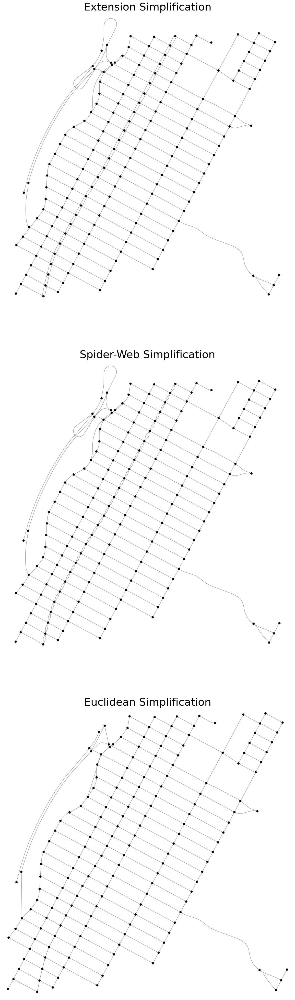

In [24]:
graph = ox.get_undirected(ox.project_graph(ox.graph_from_point(point, dist=1000, network_type='drive', simplify=True)))
fig, Axes = plt.subplots(figsize=(15,50), nrows=3)

simplified_graph_extend = consolidate_intersections(graph, tolerance=30, rebuild_edges_method='extend')
fig, Axes[0] = ox.plot_graph(simplified_graph_extend, ax=Axes[0], node_color='k', node_size=40, bgcolor='white', show=False, close=False)
Axes[0].set_title('Extension Simplification', size=30)

simplified_graph_spider = consolidate_intersections(graph, tolerance=30, rebuild_edges_method='spider')
fig, Axes[1] = ox.plot_graph(simplified_graph_spider, ax=Axes[1], node_color='k', node_size=40, bgcolor='white', show=False, close=False)
Axes[1].set_title('Spider-Web Simplification', size=30)

simplified_graph_euclidean = consolidate_intersections(graph, tolerance=30, rebuild_edges_method='euclidean')
fig, Axes[2] = ox.plot_graph(simplified_graph_euclidean, ax=Axes[2], node_color='k', node_size=40, bgcolor='white', show=False, close=False)
Axes[2].set_title('Euclidean Simplification', size=30)

plt.show()

The as the crow flies simplification isn't helpful for visualization, and the distances are very loose approximations. However, for purposes of adjacency computations it works perfectly fine in less time. 

# 4. Runtime comparison

Comparing runtimes first if we don't rebuild the edges:

In [25]:
for dist in [250, 500, 1000, 2000, 4000, 5000, 7500, 10000]:
    print('\n Graph radius:', dist)
    graph = ox.graph_from_point(point, dist=dist, network_type='drive', simplify=True)
    graph_proj = ox.project_graph(graph)
    graph_proj_und = ox.get_undirected(graph_proj)

    start = datetime.now()
    graph_simp_net = consolidate_intersections(graph_proj_und, tolerance=30, rebuild_graph=False)
    runtime_net = datetime.now() - start
    print('Network component way:', runtime_net)

    start = datetime.now()
    graph_simp_osmnx = ox.consolidate_intersections(graph_proj, tolerance=30, rebuild_graph=False)
    runtime_ox = datetime.now() - start
    print('Osmnx way:', runtime_ox)

    print('The OSMNx way takes {0:.2f} times the runtime of the network component way'.format(runtime_ox/runtime_net, dist))


 Graph radius: 250
Network component way: 0:00:00.005001
Osmnx way: 0:00:00.003917
The OSMNx way takes 0.78 times the runtime of the network component way

 Graph radius: 500
Network component way: 0:00:00.010107
Osmnx way: 0:00:00.011785
The OSMNx way takes 1.17 times the runtime of the network component way

 Graph radius: 1000
Network component way: 0:00:00.021483
Osmnx way: 0:00:00.034638
The OSMNx way takes 1.61 times the runtime of the network component way

 Graph radius: 2000
Network component way: 0:00:00.067310
Osmnx way: 0:00:00.138239
The OSMNx way takes 2.05 times the runtime of the network component way

 Graph radius: 4000
Network component way: 0:00:00.351629
Osmnx way: 0:00:00.450172
The OSMNx way takes 1.28 times the runtime of the network component way

 Graph radius: 5000
Network component way: 0:00:00.818163
Osmnx way: 0:00:01.364167
The OSMNx way takes 1.67 times the runtime of the network component way

 Graph radius: 7500
Network component way: 0:00:01.580965
O

The network component way is slightly faster (could probably be made faster since we don't need to copy the graph!) even than the OSMNx in all cases considered.

Let's do it with Euclidean straight-line reconstruction:

In [26]:
for dist in [250, 500, 1000, 2000, 4000, 5000, 7500, 10000]:
    print('\n Graph radius:', dist)
    graph = ox.graph_from_point(point, dist=500, network_type='drive', simplify=True)
    graph_proj = ox.project_graph(graph)
    graph_proj_und = ox.get_undirected(graph_proj)

    start = datetime.now()
    graph_simp_net = consolidate_intersections(graph_proj_und, tolerance=30, rebuild_graph=True, rebuild_edges_method='euclidean')
    runtime_net = datetime.now() - start
    print('Network component way:', runtime_net)

    start = datetime.now()
    graph_simp_osmnx = ox.consolidate_intersections(graph_proj, tolerance=30, rebuild_graph=True)
    runtime_ox = datetime.now() - start
    print('Osmnx way:', runtime_ox)

    print('The OSMNx way takes {0:.2f} times the runtime of the network component way'.format(runtime_ox/runtime_net, dist))


 Graph radius: 250
Network component way: 0:00:00.044077
Osmnx way: 0:00:00.035622
The OSMNx way takes 0.81 times the runtime of the network component way

 Graph radius: 500
Network component way: 0:00:00.025255
Osmnx way: 0:00:00.031025
The OSMNx way takes 1.23 times the runtime of the network component way

 Graph radius: 1000
Network component way: 0:00:00.025922
Osmnx way: 0:00:00.031136
The OSMNx way takes 1.20 times the runtime of the network component way

 Graph radius: 2000
Network component way: 0:00:00.025938
Osmnx way: 0:00:00.031361
The OSMNx way takes 1.21 times the runtime of the network component way

 Graph radius: 4000
Network component way: 0:00:00.026272
Osmnx way: 0:00:00.031836
The OSMNx way takes 1.21 times the runtime of the network component way

 Graph radius: 5000
Network component way: 0:00:00.026249
Osmnx way: 0:00:00.031463
The OSMNx way takes 1.20 times the runtime of the network component way

 Graph radius: 7500
Network component way: 0:00:00.025138
O

Still, the new function works faster. Now for spider-web method:

In [27]:
graphs_net = []
graphs_ox = []
for dist in [250, 500, 1000, 2000, 4000, 5000, 7500, 10000]:
    print('\n Graph radius:', dist)
    graph = ox.graph_from_point(point, dist=dist, network_type='drive', simplify=True)
    graph_proj = ox.project_graph(graph)
    graph_proj_und = ox.get_undirected(graph_proj)

    start = datetime.now()
    graph_simp_net = consolidate_intersections(graph_proj_und, tolerance=30, rebuild_graph=True, rebuild_edges_method='spider')
    runtime_net = datetime.now() - start
    graphs_net.append(graph_simp_net)
    print('Network component way:', runtime_net)

    start = datetime.now()
    graph_simp_osmnx = ox.consolidate_intersections(graph_proj, tolerance=30, rebuild_graph=True)
    runtime_ox = datetime.now() - start
    graphs_ox.append(graph_simp_osmnx)
    print('Osmnx way:', runtime_ox)

    print('The OSMNx way takes {0:.2f} times the runtime of the network component way'.format(runtime_ox/runtime_net, dist))


 Graph radius: 250
Network component way: 0:00:00.017651
Osmnx way: 0:00:00.017354
The OSMNx way takes 0.98 times the runtime of the network component way

 Graph radius: 500
Network component way: 0:00:00.051811
Osmnx way: 0:00:00.037493
The OSMNx way takes 0.72 times the runtime of the network component way

 Graph radius: 1000
Network component way: 0:00:00.132023
Osmnx way: 0:00:00.087401
The OSMNx way takes 0.66 times the runtime of the network component way

 Graph radius: 2000
Network component way: 0:00:00.370800
Osmnx way: 0:00:00.268169
The OSMNx way takes 0.72 times the runtime of the network component way

 Graph radius: 4000
Network component way: 0:00:01.213657
Osmnx way: 0:00:00.998629
The OSMNx way takes 0.82 times the runtime of the network component way

 Graph radius: 5000
Network component way: 0:00:02.436983
Osmnx way: 0:00:02.500574
The OSMNx way takes 1.03 times the runtime of the network component way

 Graph radius: 7500
Network component way: 0:00:05.705239
O

We can plot those two graphs in columns to compare:

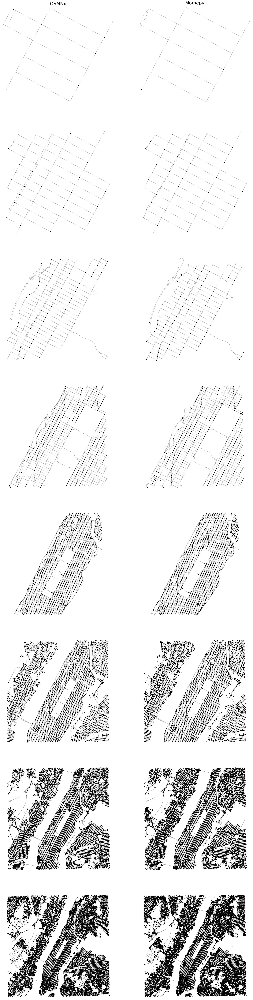

In [28]:
fig, Ax = plt.subplots(figsize=(30, 15*8), ncols=2, nrows=8)

for graph_ox, graph_net, axes in zip(graphs_ox, graphs_net, Ax):
    fig, axes[0] = ox.plot_graph(graph_ox, ax=axes[0], node_color='k', node_size=20, bgcolor='white', show=False, close=False)
    fig, axes[1] = ox.plot_graph(graph_net, ax=axes[1], node_color='k', node_size=20, bgcolor='white', show=False, close=False)

Ax[0,0].set_title('OSMNx', size=30)
Ax[0,1].set_title('Momepy', size=30)
plt.show()